In [16]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [17]:
import pandas as pd
import numpy as np
import arviz as az
import matplotlib.pyplot as plt
import os

from cmdstanpy import CmdStanModel
from tensorflow_probability.substrates import numpy as tfp
tfd = tfp.distributions

# Create ./stan folder if does not exists
if not os.path.exists("/content/drive/My Drive/Bayesian/stan"):
    os.mkdir("/content/drive/My Drive/Bayesian/stan")

In [18]:
# Import data
data = pd.read_csv('/content/drive/My Drive/Bayesian/All_values_Clean.csv')
data.head(5)

,Unnamed: 0,Id_sensor,Time,NOx,max_wind10,avg_wind10,max_wind100,avg_wind100,max_humidity,avg_humidity,...,sin12,cos12,sin6,cos6,sin4,cos4,sin3,cos3,lat,lng
0,7145,6204,gennaio 16,5.094537,-0.883564,-1.033000,-0.448047,-0.632854,0.614262,0.775022,...,0.500,0.866,0.866,0.5,1,0,0.866,-0.5,45.519335,9.59201
1,7146,6204,febbraio 16,4.847209,-0.160893,-0.054538,0.083888,0.459680,-0.152361,0.826117,...,0.866,0.500,0.866,-0.5,0,-1,-0.866,-0.5,45.519335,9.59201
2,7147,6204,marzo 16,3.911859,0.257496,-0.447750,0.367014,-0.273935,-0.152361,0.137046,...,1.000,0.000,0.000,-1.0,-1,0,0.000,1.0,45.519335,9.59201
3,7148,6204,aprile 16,3.763297,-0.984991,-0.200262,-0.928504,-0.113883,-1.685606,-0.319251,...,0.866,-0.500,-0.866,-0.5,0,1,0.866,-0.5,45.519335,9.59201
4,7149,6204,maggio 16,3.808000,-0.718744,-0.524298,-0.413729,-0.419238,-0.152361,-0.147897,...,0.500,-0.866,-0.866,0.5,1,0,-0.866,-0.5,45.519335,9.59201


In [19]:
data['lnNOx']=data['NOx']
data['NOx']=np.exp(data['NOx'])
data.head()

,Unnamed: 0,Id_sensor,Time,NOx,max_wind10,avg_wind10,max_wind100,avg_wind100,max_humidity,avg_humidity,...,cos12,sin6,cos6,sin4,cos4,sin3,cos3,lat,lng,lnNOx
0,7145,6204,gennaio 16,163.128226,-0.883564,-1.033000,-0.448047,-0.632854,0.614262,0.775022,...,0.866,0.866,0.5,1,0,0.866,-0.5,45.519335,9.59201,5.094537
1,7146,6204,febbraio 16,127.384343,-0.160893,-0.054538,0.083888,0.459680,-0.152361,0.826117,...,0.500,0.866,-0.5,0,-1,-0.866,-0.5,45.519335,9.59201,4.847209
2,7147,6204,marzo 16,49.991790,0.257496,-0.447750,0.367014,-0.273935,-0.152361,0.137046,...,0.000,0.000,-1.0,-1,0,0.000,1.0,45.519335,9.59201,3.911859
3,7148,6204,aprile 16,43.090264,-0.984991,-0.200262,-0.928504,-0.113883,-1.685606,-0.319251,...,-0.500,-0.866,-0.5,0,1,0.866,-0.5,45.519335,9.59201,3.763297
4,7149,6204,maggio 16,45.060215,-0.718744,-0.524298,-0.413729,-0.419238,-0.152361,-0.147897,...,-0.866,-0.866,0.5,1,0,-0.866,-0.5,45.519335,9.59201,3.808000


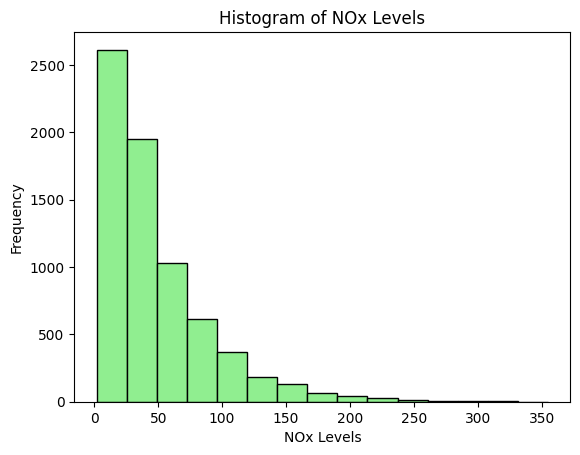

In [20]:
plt.hist(data['NOx'], bins=15, color='lightgreen', edgecolor='black')  # Adjust the number of bins as needed

# Adding labels and title
plt.xlabel('NOx Levels')
plt.ylabel('Frequency')
plt.title('Histogram of NOx Levels')

# Displaying the histogram
plt.show()

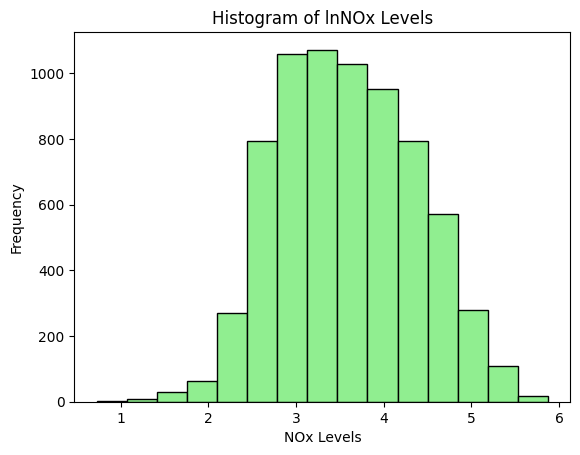

In [21]:
plt.hist(data['lnNOx'], bins=15, color='lightgreen', edgecolor='black')  # Adjust the number of bins as needed

# Adding labels and title
plt.xlabel('NOx Levels')
plt.ylabel('Frequency')
plt.title('Histogram of lnNOx Levels')

# Displaying the histogram
plt.show()

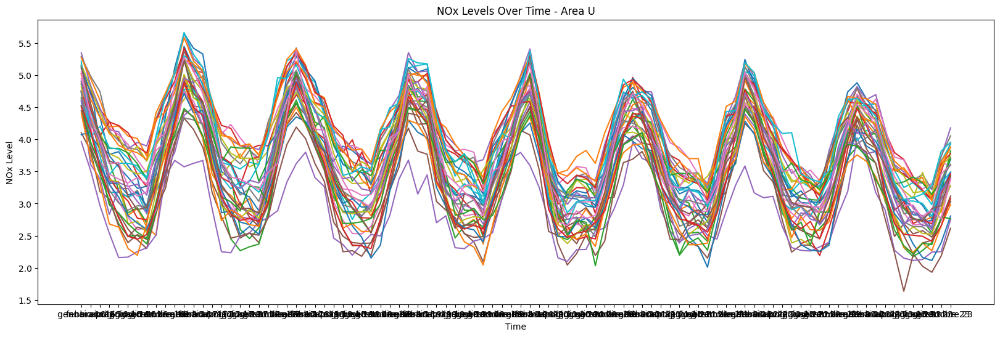

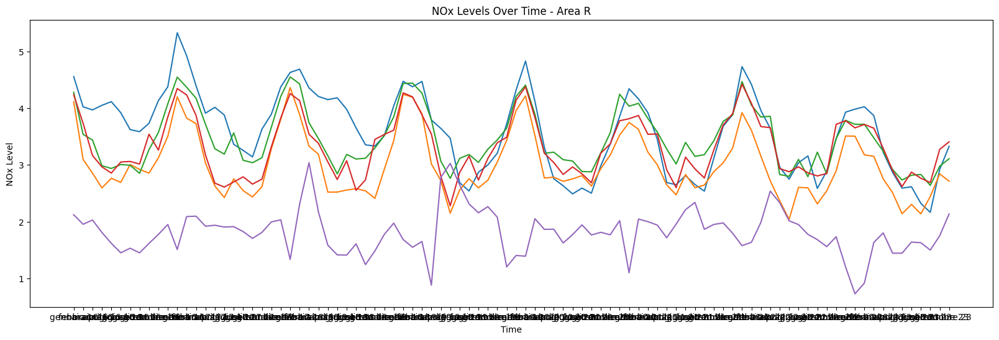

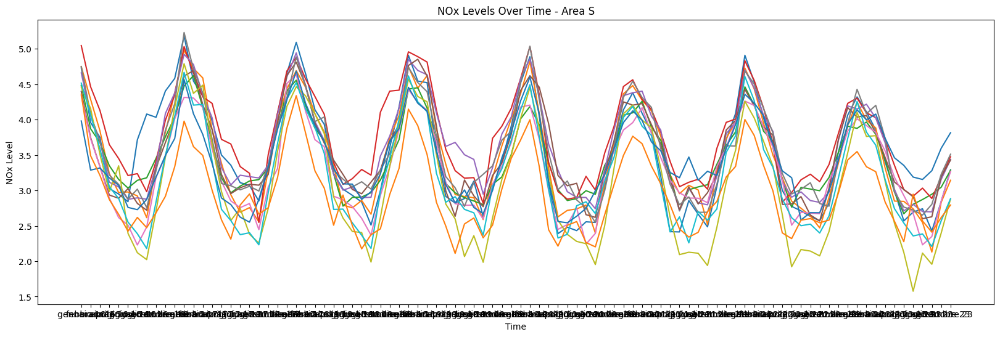

In [22]:

# Filter data for each area
area_U_data = data[data['area'] == 'U']
area_R_data = data[data['area'] == 'R']
area_S_data = data[data['area'] == 'S']

# Plotting for Area U
plt.figure(figsize=(20, 6))
for sensor_id, sensor_data in area_U_data.groupby('Id_sensor'):
    plt.plot(sensor_data['Time'], sensor_data['lnNOx'], label=f'Sensor {sensor_id}')

plt.title('NOx Levels Over Time - Area U')
plt.xlabel('Time')
plt.ylabel('NOx Level')
plt.show()

# Plotting for Area R
plt.figure(figsize=(20, 6))
for sensor_id, sensor_data in area_R_data.groupby('Id_sensor'):
    plt.plot(sensor_data['Time'], sensor_data['lnNOx'], label=f'Sensor {sensor_id}')

plt.title('NOx Levels Over Time - Area R')
plt.xlabel('Time')
plt.ylabel('NOx Level')
plt.show()

# Plotting for Area S
plt.figure(figsize=(20, 6))
for sensor_id, sensor_data in area_S_data.groupby('Id_sensor'):
    plt.plot(sensor_data['Time'], sensor_data['lnNOx'], label=f'Sensor {sensor_id}')

plt.title('NOx Levels Over Time - Area S')
plt.xlabel('Time')
plt.ylabel('NOx Level')
plt.show()

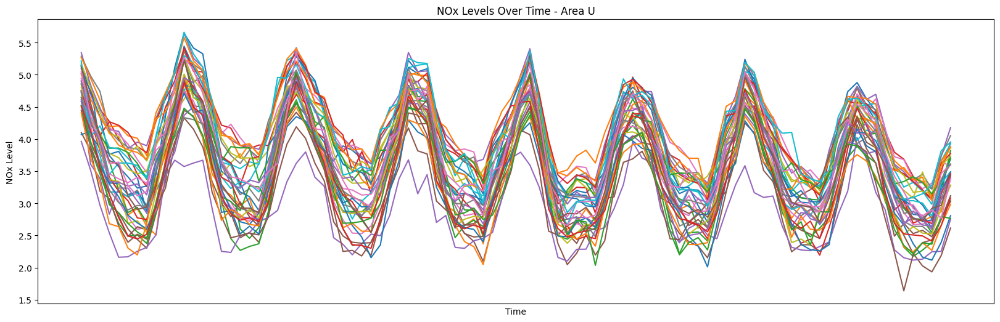

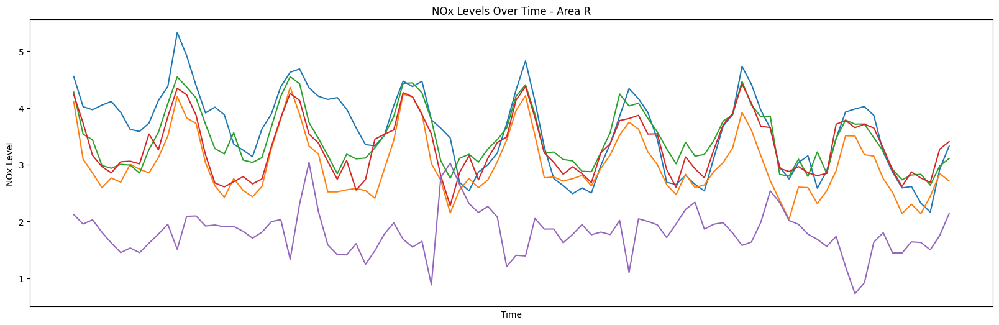

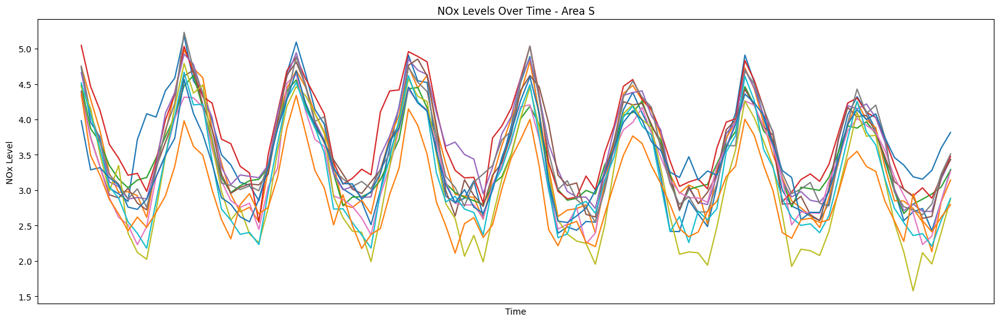

In [23]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame containing time series data
# with columns 'Id_sensor', 'area', 'lnNOx'

# Filter data for each area
area_U_data = data[data['area'] == 'U']
area_R_data = data[data['area'] == 'R']
area_S_data = data[data['area'] == 'S']

# Plotting for Area U
plt.figure(figsize=(20, 6))
for sensor_id, sensor_data in area_U_data.groupby('Id_sensor'):
    plt.plot(sensor_data['Time'], sensor_data['lnNOx'], label=f'Sensor {sensor_id}')

plt.title('NOx Levels Over Time - Area U')
plt.xlabel('Time')
plt.ylabel('NOx Level')
plt.xticks([])  # Hide the x-axis
plt.show()

# Plotting for Area R
plt.figure(figsize=(20, 6))
for sensor_id, sensor_data in area_R_data.groupby('Id_sensor'):
    plt.plot(sensor_data['Time'], sensor_data['lnNOx'], label=f'Sensor {sensor_id}')

plt.title('NOx Levels Over Time - Area R')
plt.xlabel('Time')
plt.ylabel('NOx Level')
plt.xticks([])  # Hide the x-axis
plt.show()

# Plotting for Area S
plt.figure(figsize=(20, 6))
for sensor_id, sensor_data in area_S_data.groupby('Id_sensor'):
    plt.plot(sensor_data['Time'], sensor_data['lnNOx'], label=f'Sensor {sensor_id}')

plt.title('NOx Levels Over Time - Area S')
plt.xlabel('Time')
plt.ylabel('NOx Level')
plt.xticks([])  # Hide the x-axis
plt.show()


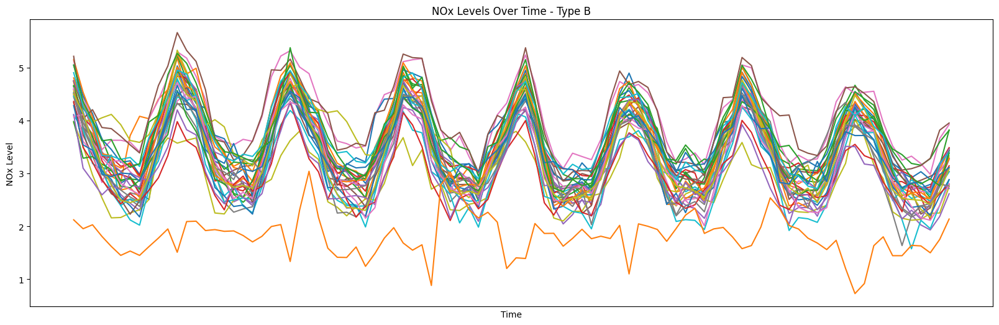

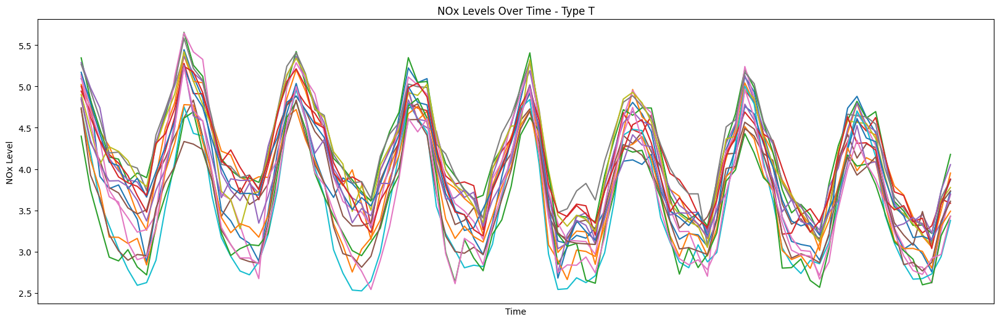

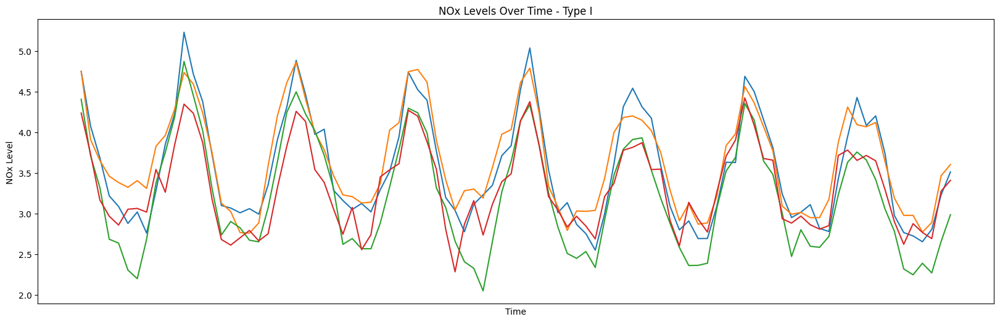

In [24]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame containing time series data
# with columns 'Id_sensor', 'Type', 'Time', 'lnNOx'

# Filter data for each type
type_B_data = data[data['type'] == 'B']
type_T_data = data[data['type'] == 'T']
type_I_data = data[data['type'] == 'I']

# Plotting for Type B
plt.figure(figsize=(20, 6))
for sensor_id, sensor_data in type_B_data.groupby('Id_sensor'):
    plt.plot(sensor_data['Time'], sensor_data['lnNOx'], label=f'Sensor {sensor_id}')

plt.title('NOx Levels Over Time - Type B')
plt.xlabel('Time')
plt.ylabel('NOx Level')
plt.xticks([])  # Hide the x-axis
plt.show()

# Plotting for Type T
plt.figure(figsize=(20, 6))
for sensor_id, sensor_data in type_T_data.groupby('Id_sensor'):
    plt.plot(sensor_data['Time'], sensor_data['lnNOx'], label=f'Sensor {sensor_id}')

plt.title('NOx Levels Over Time - Type T')
plt.xlabel('Time')
plt.ylabel('NOx Level')
plt.xticks([])  # Hide the x-axis
plt.show()

# Plotting for Type I
plt.figure(figsize=(20, 6))
for sensor_id, sensor_data in type_I_data.groupby('Id_sensor'):
    plt.plot(sensor_data['Time'], sensor_data['lnNOx'], label=f'Sensor {sensor_id}')

plt.title('NOx Levels Over Time - Type I')
plt.xlabel('Time')
plt.ylabel('NOx Level')
plt.xticks([])  # Hide the x-axis
plt.show()


In [25]:
numerical_columns_subset = data.iloc[:, 4:18]  # Assuming columns from 4 to 17 inclusive


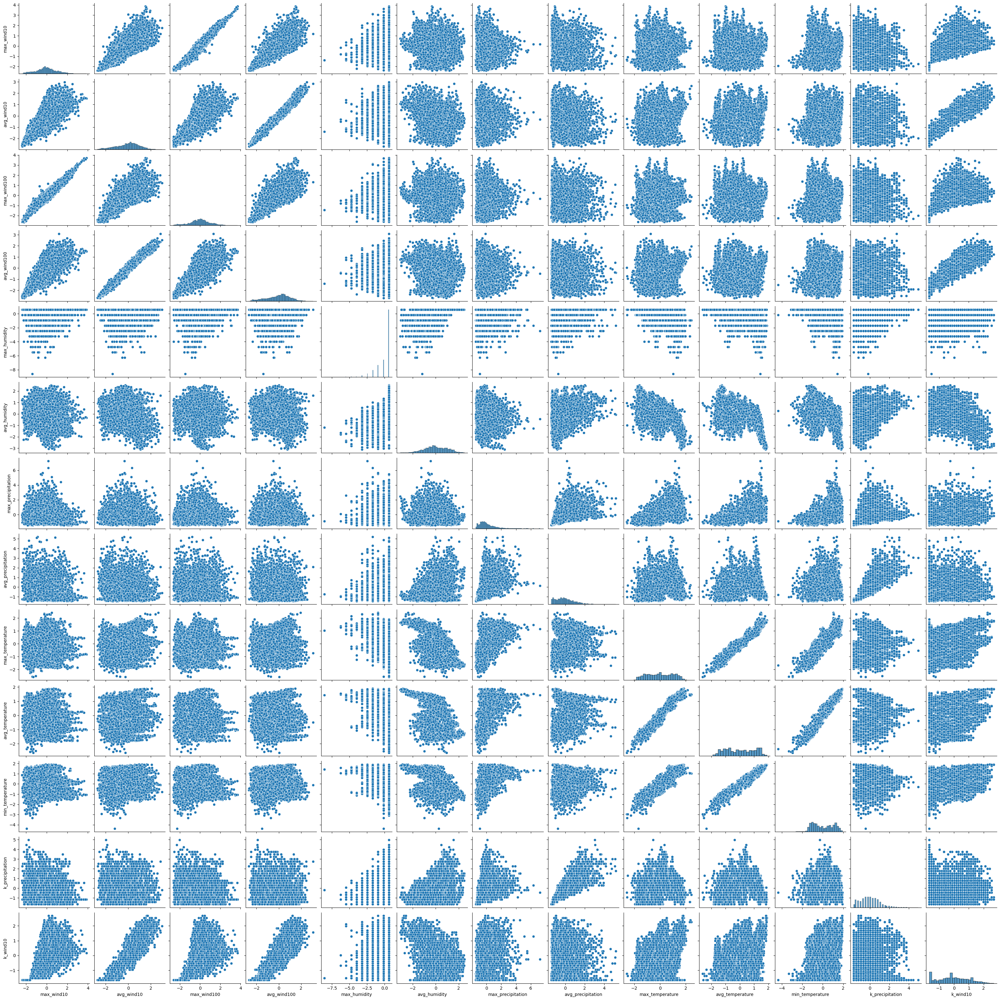

In [30]:
import seaborn as sns

# Creating the pairplot
sns.pairplot(numerical_columns_subset)
plt.show()


In [46]:
import seaborn as sns
import numpy as np

# Assuming 'numerical_data_subset' is your DataFrame containing the dataset
# with columns from 4 to 17 representing numerical variables and 'type' column with lowercase 't'
numerical_columns_subset = data.iloc[:, 4:18]  # Assuming columns from 4 to 17 inclusive

# Replace '???' with NaN
numerical_columns_subset.replace('???', np.nan, inplace=True)
# Map 'T', 'B', 'I' to 0, 1, 2 respectively
numerical_columns_subset['type'].replace({'T': 0, 'B': 1, 'I': 2}, inplace=True)





In [47]:
numerical_columns_subset

,max_wind10,avg_wind10,max_wind100,avg_wind100,max_humidity,avg_humidity,max_precipitation,avg_precipitation,max_temperature,avg_temperature,min_temperature,k_precipitation,k_wind10,type
0,-0.883564,-1.033000,-0.448047,-0.632854,0.614262,0.775022,-1.041782,-0.924117,-1.442909,-1.477609,-1.326712,-0.679566,-1.099549,0.0
1,-0.160893,-0.054538,0.083888,0.459680,-0.152361,0.826117,-0.728737,0.921431,-1.151100,-1.064318,-0.978136,0.547807,-0.260883,0.0
2,0.257496,-0.447750,0.367014,-0.273935,-0.152361,0.137046,-0.656496,-0.462942,-0.884665,-0.804922,-0.911102,-0.434091,-0.959772,0.0
3,-0.984991,-0.200262,-0.928504,-0.113883,-1.685606,-0.319251,-0.776898,-0.648766,-0.415233,-0.121794,-0.307798,-0.434091,-0.680216,0.0
4,-0.718744,-0.524298,-0.413729,-0.419238,-0.152361,-0.147897,0.282639,1.142467,0.143010,0.176097,0.013964,1.529706,0.018672,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7045,-0.211607,0.039585,-0.104864,-0.133968,-2.452228,-0.758059,1.823783,0.666983,1.246810,1.150379,1.314420,1.529706,0.857338,1.0
7046,1.157665,0.046664,0.924688,-0.093503,-0.918983,-0.588039,1.896024,1.480372,1.589369,1.434990,1.595962,1.038757,0.997116,1.0
7047,1.119629,0.543884,1.156337,0.393464,-1.685606,-1.492861,1.582979,0.579776,1.665493,1.500186,1.153539,0.302333,1.556226,1.0
7048,0.282852,-0.265388,0.186843,-0.427697,-2.452228,-0.488815,1.005050,-0.007375,0.853502,1.011922,0.831777,-0.434091,0.018672,1.0


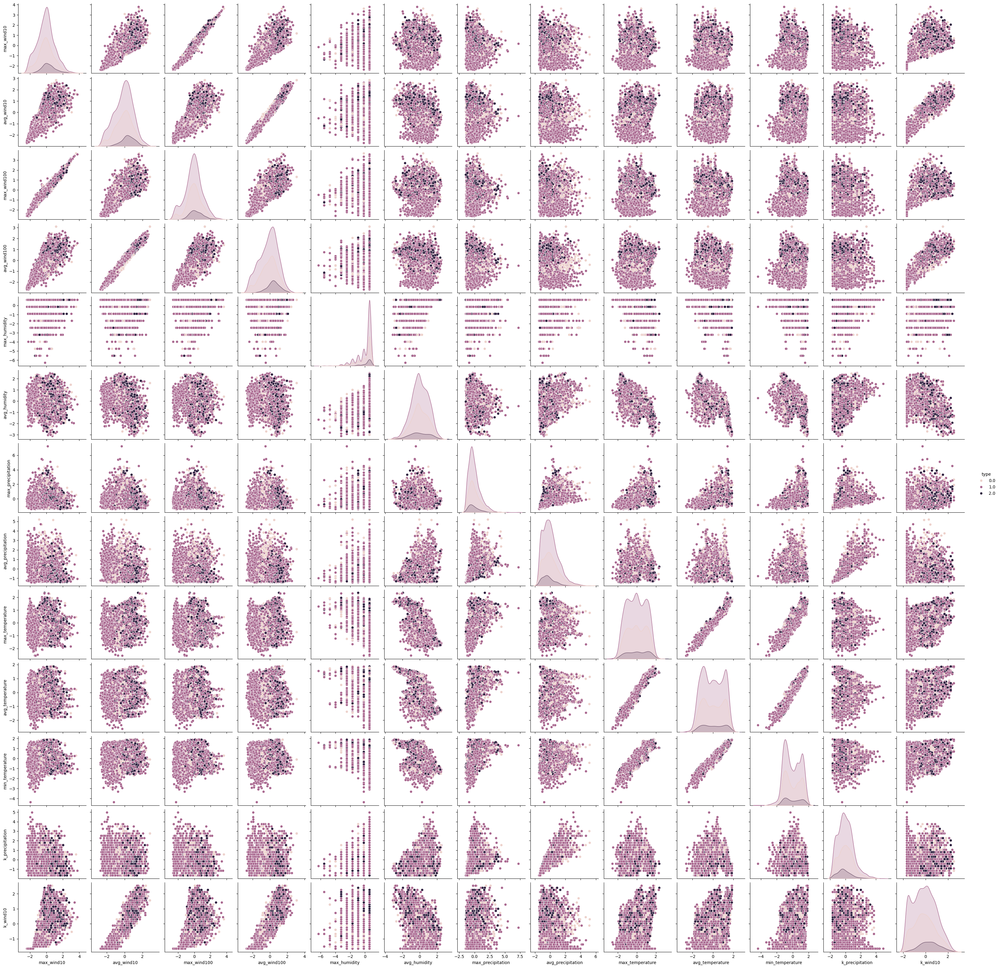

In [48]:
# Convert other columns to numeric
#numerical_data_subset = numerical_data_subset.apply(pd.to_numeric)

# Drop rows with missing values
numerical_columns_subset.dropna(inplace=True)

# Creating the pairplot
sns.pairplot(numerical_columns_subset, hue='type')
plt.show()